## Trang Duong

# Predicting House Price

This project contains code for the Predicting House Price


In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [89]:
#Load data
df_train = pd.read_csv('~/OneDrive - TnS/house_price_reg/house-prices-advanced-regression-techniques/train.csv')

In [90]:
#Check data
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [91]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Let's look at how the housing prices are distributed

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64
Skewness: 1.882876
Kurt: 6.536282


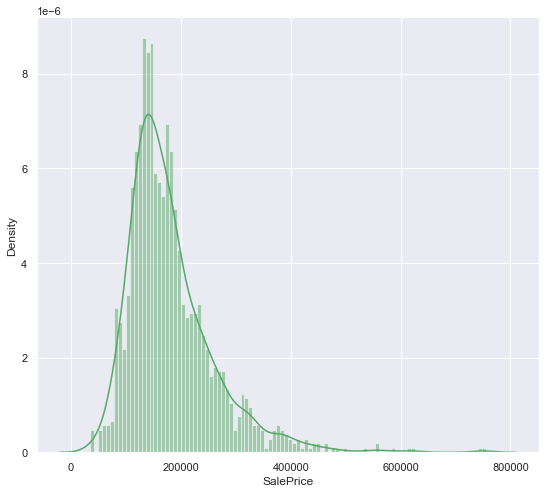

In [92]:
def eda(col):
    print(df_train[col].describe())
    plt.figure(figsize= (9,8))
    sns.distplot(df[col], color='g', bins=100, hist_kws={'alpha': 0.5});
    print("Skewness: %f" % df_train[col].skew())
    print("Kurt: %f" % df_train[col].kurt())

""" If the skewness is between -0.5 and 0.5, the data are fairly symmetrical
If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed
If the skewness is less than -1 or greater than 1, the data are highly skewed """

""" kurtosis is all about the tails of the distribution. If the kurtosis is close to 0, then a normal distribution is often assumed.  These are called mesokurtic distributions.  
If the kurtosis is less than zero, then the distribution is light tails and is called a platykurtic distribution.  
If the kurtosis is greater than zero, then the distribution has heavier tails and is called a leptokurtic distribution. """


eda('SalePrice')




The sales price distribution is unimodal, highly positive skewed, show peakedness, withoutliers lies above ~500,000. We will eventually want to remove them to get a normal distribution for machine learning.


### SalePrice relationship with other numerical variables

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


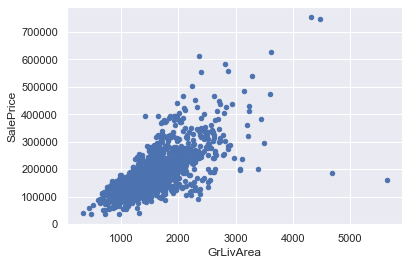

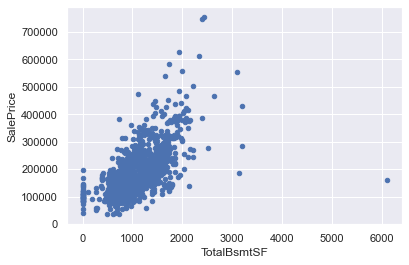

In [93]:
#Scatter plot grlivarea/saleprice
def scatter_plot(var):
    data = pd.concat([df['SalePrice'], df[var]], axis = 1)
    data.plot.scatter(x = var, y = 'SalePrice')

scatter_plot('GrLivArea')
scatter_plot('TotalBsmtSF')

There are some linear relationship between GrLivArea and SalePrice, the linear relationship between TotalBsmtSF and SalePrice seems almost exponential.


### Relationship between SalePrice and categorical variable


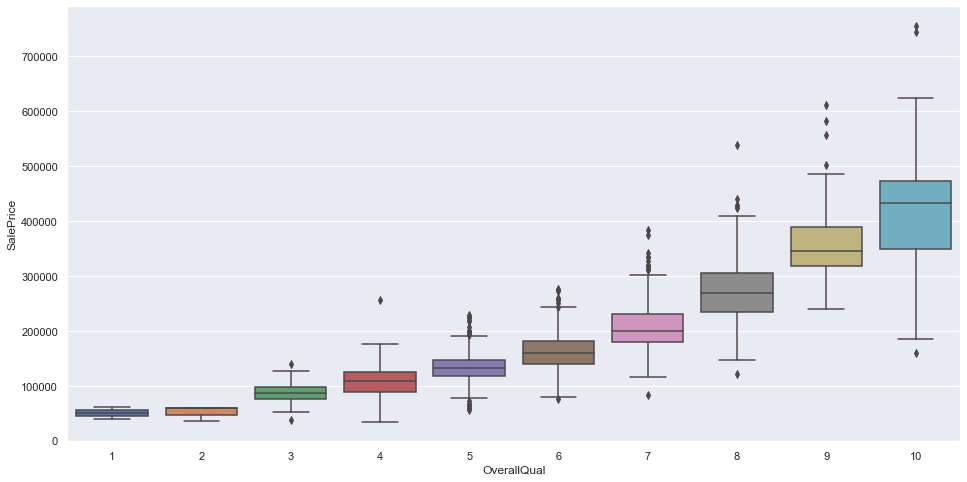

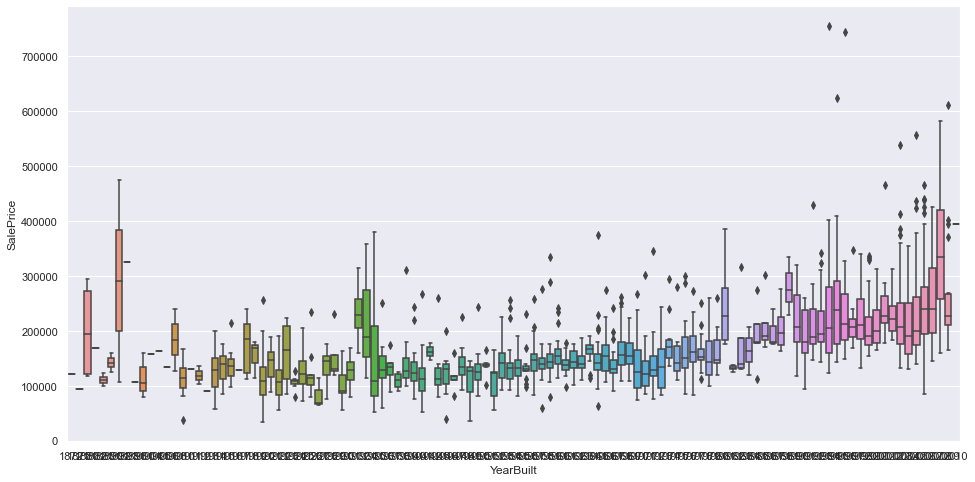

In [94]:
def boxplot(var):
    data = pd.concat([df['SalePrice'], df[var]], axis =1)
    f,ax = plt.subplots(figsize = (16,8))
    plot = sns.boxplot(x = var, y = 'SalePrice', data = data)

boxplot('OverallQual')
boxplot('YearBuilt')

Better quality will generally lead to higher price. The year that the house was built has somewhat linear relationship with the house price.

### Correlation matrix (heatmap style)

<AxesSubplot:>

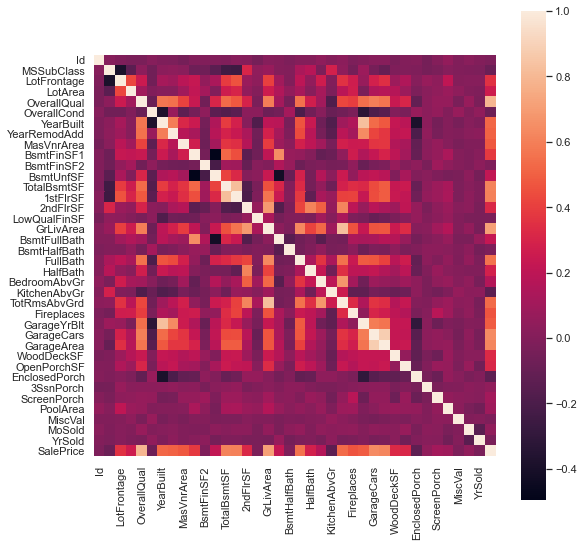

In [95]:
corrmat = df_train.corr()
f, ax = plt.subplots(figsize = (9,9))
sns.heatmap(corrmat, square=True)

It is quite evident that there is a strong correlation between SalePrice and OverallQual. TotalBsmtSF and 1stFlrSF also have strong correlation with SalePrice, a well as Garage variables. This information can suggest a situation of multicollinearity.

### 'SalePrice' correlation matrix (zoomed heatnap style)

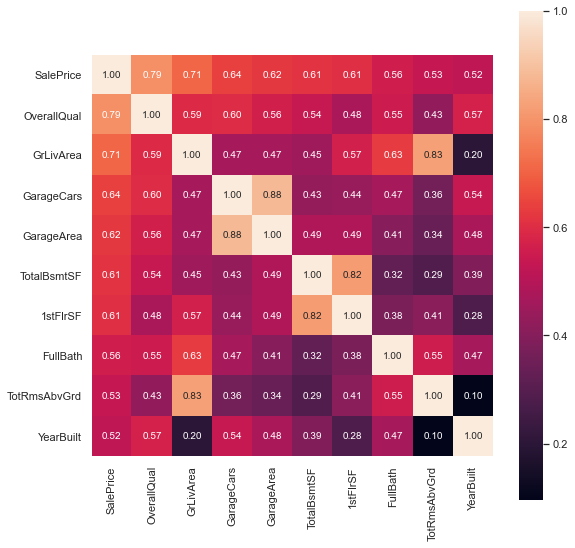

In [96]:
k = 10 #take the 10 highest correlation
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index #get the 10 highest correlation with SalesPrice, subset the name, and return only the colname
cm = df_train[cols].corr()
f, ax = plt.subplots(figsize = (9,9))
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values) #use annot = True to show the values
plt.show()

1. 'OverallQual', 'GrLivArea', 'TotalBsmtSF' are strongly correlated with 'SalePrice'.
2. 'GarageCars' and 'GarageArea' are strongly correlated variables, so we should just choose one (preferably the higher one) - 'GarageCars'.
3. We might exepct 'TotalBsmtSF' and '1stFlrSF' to be correlated.
4. We might also expect 'GrLivArea' and 'TotTmsAbvGrd' to be correlated.
5. We might want to do some time series analysis with 'YearBuilt'.


### Scatter plots between 'SalePrice' and correlated variables

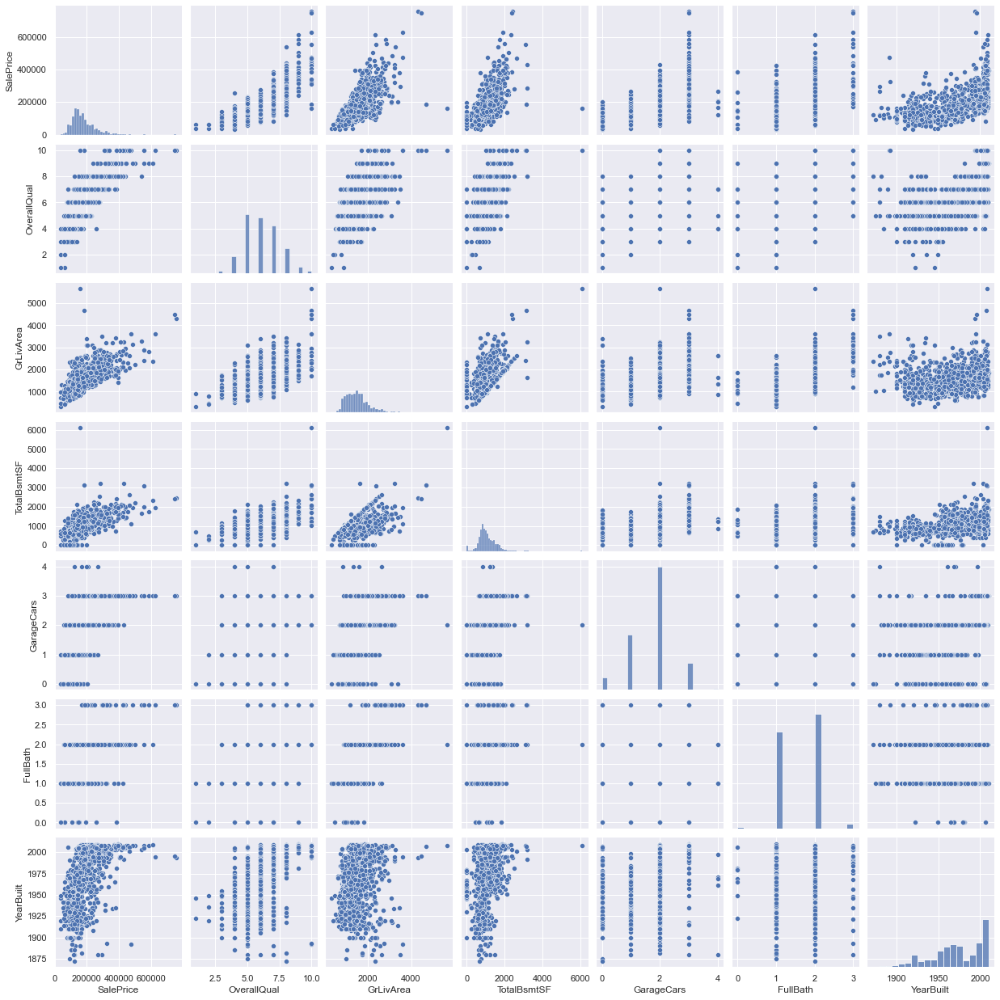

In [97]:
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'TotalBsmtSF', 'GarageCars', 'FullBath', 'YearBuilt']
sns.pairplot(df_train[cols], size = 2.5)
plt.show()

Generally, this graph confirms what we have found so far. One interesting point is that 'SalePrice' has a somewhat exponential pattern in the recent 'YearBuilt', suggesting that house prices for recent houses are increasing.

### Missing data

In [119]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (total/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479
